# HR(S)TEM filter

### Tao Ma, Lead TEM Scientist at MC2, University of Michigan

taoma@umich.edu


This notebook is for batch-denoising HR(S)TEM images. A Wiener filter and an average background subtraction filter were designed based on __R. Kilaas J. Microscopy, 1998, 190, 45-51__. Some steps are adopted from D. R. G. Mitchell's script for GMS. A nonlinear filter was adopted by the "non-linear filter plugin from GMS", originally developed by Dr. Hongchu Du. Refer to the original paper: __Hongchu Du, A nonlinear filtering algorithm for denoising HR(S)TEM micrographs, Ultramicroscopy 2015, 151, 62-67__

In this notebook, I used `rsciio` as the i/o tool to batch open and save files. `rsciio` supports almost all types of common TEM image formats, such as GMS dm3 and dm4 files, FEI Velox emd files, TIA ser files, etc. For a complete list of supported formats, please refer to the [website](https://hyperspy.org/rosettasciio/). To maximize the compatability, the filtered images will be saved as tif with 32-bit float data formats. If the pixel scale is included in the input, it should be translated to the filtered images as well, which can be read by ImageJ, Gatan GMS, etc. 

A GUI tool is designed for opening images, which needs `tkinter` module.  

## 1. Import modules and load some helper functions
The first cell defines some helper functions and imports all the necessary modules.

In [10]:
%matplotlib widget
from rsciio.emd import file_reader as emd_reader
from rsciio.tiff import file_reader as tiff_reader
from rsciio.digitalmicrograph import file_reader as dm_reader
from rsciio.tia import file_reader as tia_reader
from rsciio.tiff import file_writer as tiff_writer
from tkinter import Tk
from tkinter.filedialog import askopenfilenames
from hrtem_filter import filters
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift, ifftshift, ifft2
import numpy as np
import os

# Some helper functions
def getDirectory(path):
    return os.path.dirname(path)
        
def getFileNameType(path):
    file = os.path.basename(path)
    name_ext = os.path.splitext(file)
    name = name_ext[0]
    ext = name_ext[1][1:] #Remove the dot
    return name, ext

    
# A function to open multiple files with GUI
def open_files_with_gui():
    # Hide the main tkinter window
    Tk().withdraw()

    # Open the file dialog and get file path
    files = askopenfilenames(title='Select images to denoise')

    # Check if a file is selected
    if files:
        # Return the file name and file path
        return files
    
def file_loader(path):
    name, ext = getFileNameType(path)
    if ext.lower() in ['dm3', 'dm4']:
        img = dm_reader(path)
    elif ext.lower() in ['emd', 'ser']:
        img = emd_reader(path)
    elif ext.lower() in ['tif', 'tiff']:
        img = tiff_reader(path)
    elif ext.lower() in ['ser']:
        img = tia_reader(path)
    else:
        raise ValueError(f"Unsupported file format: {ext}")
    return img
    
# Plot original vs filtered vs difference function, with their FFTs
def plot_imgs(img, img_f, diff, title, FFT=False, fft_pvmin = 30, fft_pvmax = 99.9):
    img_data = [img, img_f, diff]
    img_title = ['Original', 'Filtered', 'Difference']
    if FFT:
        fig, ax = plt.subplots(2, 3, figsize=(10,7))
        f_img = [fftshift(fft2(filters.pad_to_square(im))) for im in img_data]
        for j in range(3):
            ax[0,j].imshow(img_data[j], cmap='gray')
            ax[0,j].set_xticks([])
            ax[0,j].set_yticks([])
            ax[0,j].grid(False)
            ax[0,j].set_title(img_title[j])
            fft = np.abs(f_img[j])
            fft_vmin = np.percentile(fft, fft_pvmin)
            fft_vmax = np.percentile(fft, fft_pvmax)
            ax[1,j].imshow(fft, vmin=fft_vmin, vmax=fft_vmax)
            ax[1,j].set_xticks([])
            ax[1,j].set_yticks([])
            ax[1,j].grid(False)        
    else:    
        fig1, ax1 = plt.subplots(1,3, figsize=(10,4))
        for i in range(3):
            ax1[i].imshow(img_data[i], cmap='gray')
            ax1[i].set_xticks([])
            ax1[i].set_yticks([])
            ax1[i].grid(False)
            ax1[i].set_title(img_title[i])
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

## 2. Open files and set filtering parameters
The following cell opens a window for the input images. You can select as many as you want. The filtered images will be saved to the same directory with a subfix. The filtering parameters should be set here before loading files.

In [3]:
# Load images to be filtered. Multiple images can be selected, and the process goes through each image in the list.
# Hyperspy takes almost all common TEM image formats like dm3, FEI emd, tiff, etc. 
# Check the documents for all supported formats.
imgs = open_files_with_gui()
# Setup the following parameters before running
lp_order = 2 #Order of the Butterworth low pass filter. Smaller number makes more tapered cutoff.
lp_cutoff = 0.3 #Ratio of the cutoff frequency for the lowpass filter.  
hp_cutoff = 0.02 #Ratio of the cutoff frequency for the Gaussian highpass filter.
delta = 5 # Threashold for background averaging. Smaller number refines the background more and takes more time.
NL_cycle = 10 #Number of cycles for the non-linear filter. More iterations take more time.
print('Images to be filtered:')
for i in imgs:
    print(i)

Images to be filtered:
/Users/taoma/Desktop/hrtem_filter/test data/HAADF-test.tiff
/Users/taoma/Desktop/hrtem_filter/test data/iDPC-test.tiff


# 3. Simple use case: apply selected filter and save as tiff

Applying ABS filter to image: HAADF-test


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


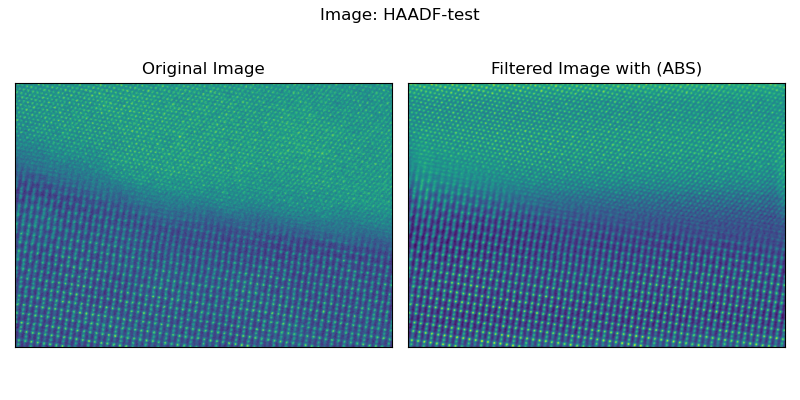

Filtered image saved as: /Users/taoma/Desktop/hrtem_filter/test data/HAADF-test_ABS_filtered.tiff
Applying ABS filter to image: iDPC-test


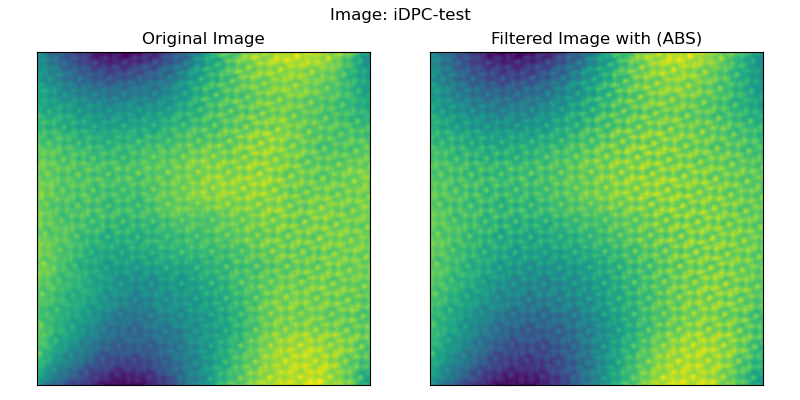

Filtered image saved as: /Users/taoma/Desktop/hrtem_filter/test data/iDPC-test_ABS_filtered.tiff


In [4]:
filter_type = 'ABS' # Choose from 'Wiener', 'ABS', 'NL', 'BW', 'Gaussian'

# Iterate through all images, apply filters, and save as tiff
for i in imgs:
    img = file_loader(i)[0]
    img_path = getDirectory(i)
    img_name = getFileNameType(i)[0]
    img_data = img['data']

    # Apply filter and plot
    print(f'Applying {filter_type} filter to image: {img_name}')
    filtered = filters.apply_filter(img_data, filter_type=filter_type, delta=delta, lowpass_order=lp_order, lowpass_cutoff=lp_cutoff)

    fig, ax = plt.subplots(1,2, figsize=(8,4))
    ax[0].imshow(img_data)
    ax[0].set_title('Original Image')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].imshow(filtered)
    ax[1].set_title(f'Filtered Image with ({filter_type})')
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    plt.suptitle(f'Image: {img_name}')
    plt.tight_layout()
    plt.show()

    # Save filtered image as tiff
    save_path = os.path.join(img_path, f"{img_name}_{filter_type}_filtered.tiff")
    filtered_img = img.copy()
    filtered_img['data'] = filtered
    tiff_writer(save_path, filtered_img)
    print(f"Filtered image saved as: {save_path}")

# 4. Run filtering on image stack

Filtering stack with Wiener filter...
Filtering complete!
Original stack shape: (10, 1024, 1024)


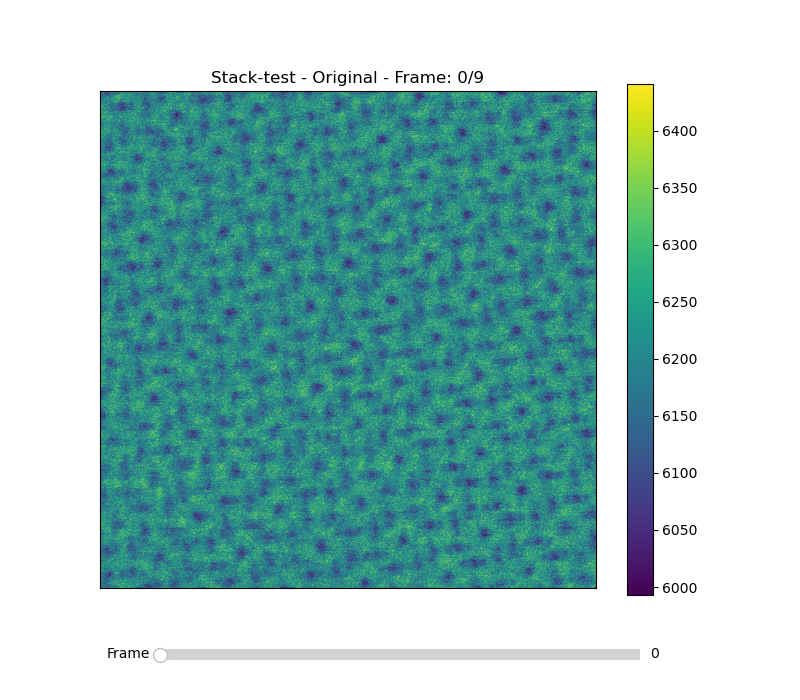

Filtered stack shape: (10, 1024, 1024)


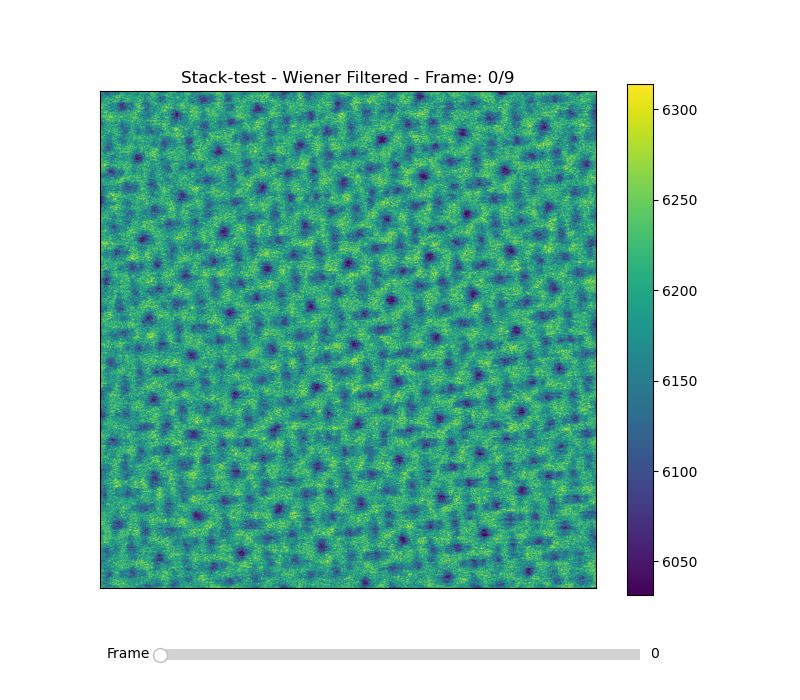

Filtered stack saved as: /Users/taoma/Desktop/hrtem_filter/test data/Stack-test_Wiener_filtered.tiff


In [5]:
# Interactive stack viewer with slider
from matplotlib.widgets import Slider
import matplotlib.pyplot as plt
import numpy as np

def view_stack_with_slider(stack, cmap='viridis', title='Stack Viewer', vmin=None, vmax=None):
    """
    View a 3D stack of images with an interactive slider.
    
    Parameters:
    -----------
    stack : ndarray
        3D array with shape (frames, height, width)
    cmap : str
        Colormap to use
    title : str
        Title for the viewer
    vmin, vmax : float
        Min and max values for colormap scaling. If None, auto-scale.
    """
    # Set consistent vmin/vmax across all frames if not provided
    if vmin is None:
        vmin = np.percentile(stack, 0.1)
    if vmax is None:
        vmax = np.percentile(stack, 99.9)
    
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(8, 7))
    plt.subplots_adjust(bottom=0.15)
    
    # Display first frame
    im = ax.imshow(stack[0], cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{title} - Frame: 0/{len(stack)-1}')
    plt.colorbar(im, ax=ax)
    
    # Create slider axis
    ax_slider = plt.axes([0.2, 0.05, 0.6, 0.03])
    slider = Slider(
        ax_slider, 
        'Frame', 
        0, 
        len(stack) - 1, 
        valinit=0, 
        valstep=1,
        color='lightblue'
    )
    
    # Update function for slider
    def update(val):
        frame = int(slider.val)
        im.set_data(stack[frame])
        ax.set_title(f'{title} - Frame: {frame}/{len(stack)-1}')
        fig.canvas.draw_idle()
    
    slider.on_changed(update)
    
    plt.show()
    return fig, slider

# Load and filter stack
filter_type = 'Wiener'  # Choose from 'Wiener', 'ABS', 'NL', 'BW', 'Gaussian'
stack = '/Users/taoma/Desktop/hrtem_filter/test data/Stack-test.dm4'
stack_img = file_loader(stack)[0]
stack_path = getDirectory(stack)
stack_name = getFileNameType(stack)[0]
stack_data = stack_img['data']

# Apply filter to each frame in the stack
print(f'Filtering stack with {filter_type} filter...')
filtered_stack = filters.apply_filter(stack_data, filter_type=filter_type, delta=delta, lowpass_order=lp_order, lowpass_cutoff=lp_cutoff)
print('Filtering complete!')

# View original stack with slider
print(f'Original stack shape: {stack_data.shape}')
fig1, slider1 = view_stack_with_slider(stack_data, title=f'{stack_name} - Original')

# View filtered stack with slider
print(f'Filtered stack shape: {filtered_stack.shape}')
fig2, slider2 = view_stack_with_slider(filtered_stack, title=f'{stack_name} - {filter_type} Filtered')

# Save filtered stack as tiff
filtered_stack_img = stack_img.copy()
filtered_stack_img['data'] = filtered_stack
save_stack_path = os.path.join(stack_path, f"{stack_name}_{filter_type}_filtered.tiff")
tiff_writer(save_stack_path, filtered_stack_img)
print(f"Filtered stack saved as: {save_stack_path}")

# 4. Checking out individual filters

## 4.1 Wiener filter
This cell applies the Wiener filter with the difference plotted for comparison.

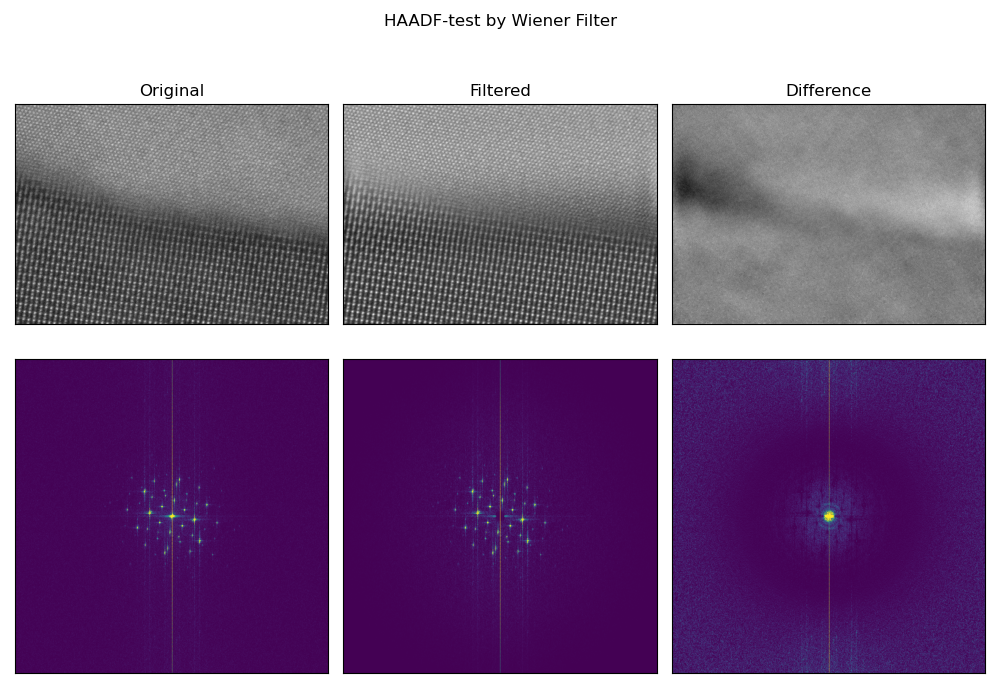

In [11]:
img_to_test = imgs[0]
img = file_loader(img_to_test)[0]
img_path = getDirectory(img_to_test)
img_name = getFileNameType(img_to_test)[0]
img_data = img['data']

# Apply filter and plot
img_wf, diff_wf = filters.wiener_filter(img_data, delta=delta, lowpass_order=lp_order, lowpass_cutoff=lp_cutoff)
plot_imgs(img_data, img_wf, diff_wf, title = f"{img_name} by Wiener Filter", FFT=True)

## 4.2 Average background subtraction filter
This cell applies the abs filter with the difference plotted for comparison.

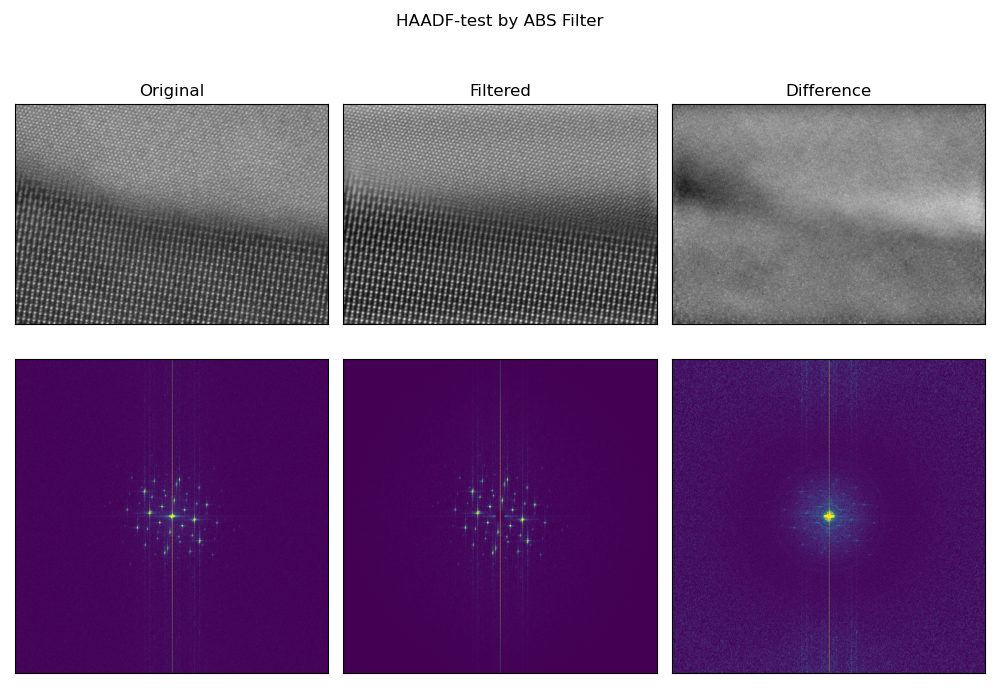

In [13]:
img_to_test = imgs[0]
img = file_loader(img_to_test)[0]
img_path = getDirectory(img_to_test)
img_name = getFileNameType(img_to_test)[0]
img_data = img['data']

# Apply filter and plot
img_absf, diff_absf = filters.abs_filter(img_data, delta=delta, lowpass_order=lp_order, lowpass_cutoff=lp_cutoff)
plot_imgs(img_data, img_absf, diff_absf, title = f"{img_name} by ABS Filter", FFT=True)

## 4.3 Nonlinear filter
This cell applies the nonlinear filter with the difference plotted for comparison. It runs slow. Be patient!

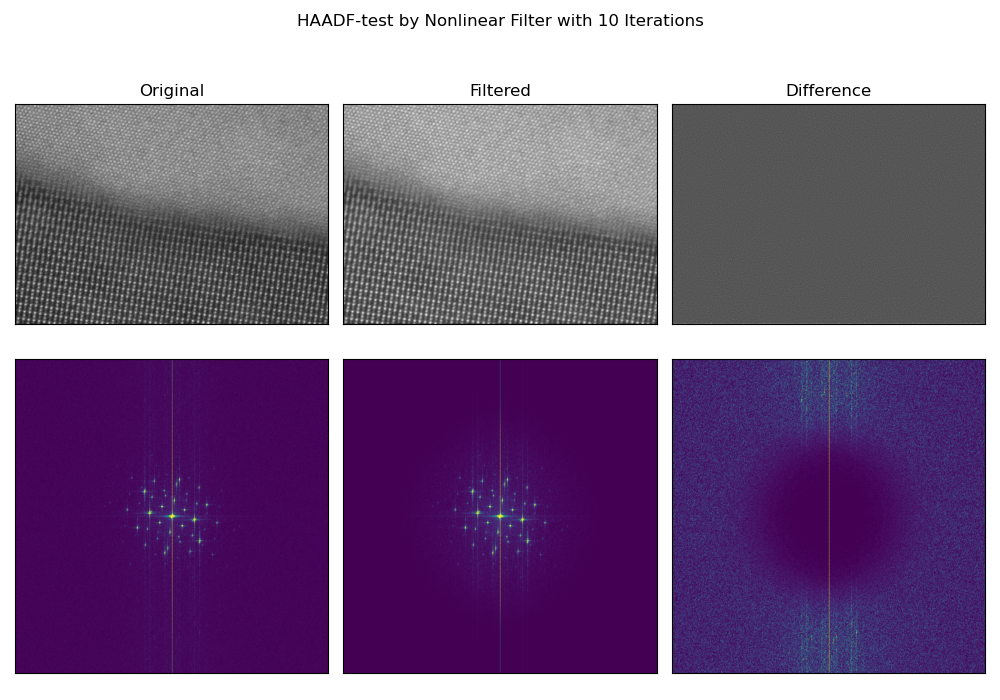

In [14]:
img_to_test = imgs[0]
img = file_loader(img_to_test)[0]
img_path = getDirectory(img_to_test)
img_name = getFileNameType(img_to_test)[0]
img_data = img['data']

# Apply filter and plot
img_nl, diff_nl = filters.nlfilter(img_data, N=NL_cycle, delta=delta, lowpass_cutoff=lp_cutoff, lowpass_order=lp_order)
plot_imgs(img_data, img_nl, diff_nl, title = f"{img_name} by Nonlinear Filter with {NL_cycle} Iterations", FFT=True)

## 4.4 Gaussian highpass on iDPC images
Usually a highpass filter is needed for iDPC images to reduce the background variation.

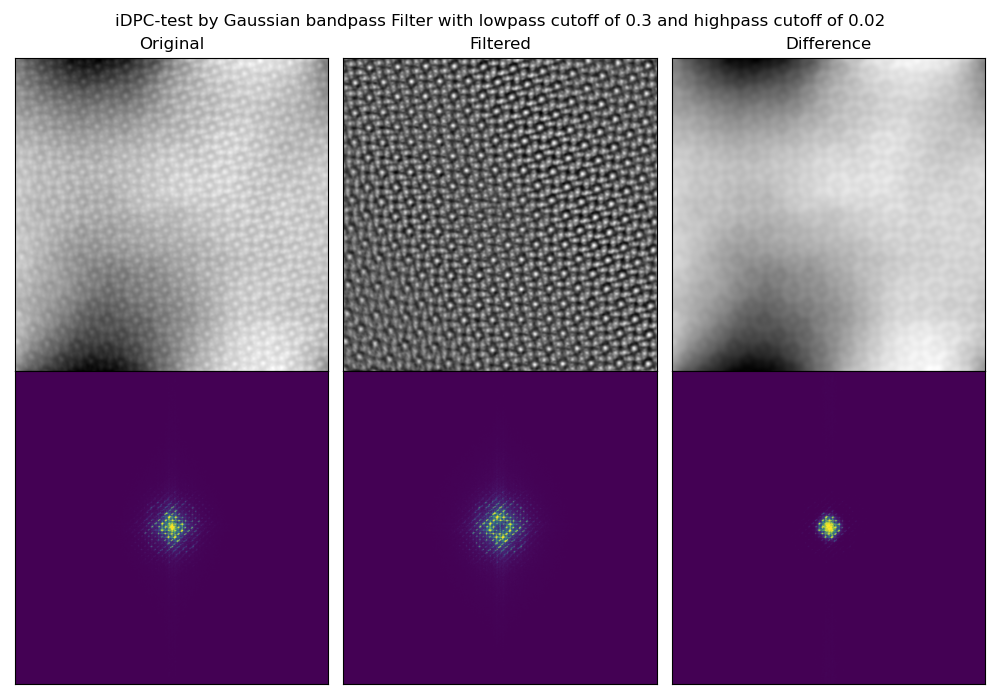

In [15]:
img_to_test = imgs[1]
img = file_loader(img_to_test)[0]
img_path = getDirectory(img_to_test)
img_name = getFileNameType(img_to_test)[0]
img_data = img['data']

# Apply a Gaussian bandpass filter with lowpass cutoff of 0.3 and highpass cutoff of 0.02
img_filtered = filters.gaussian_lowpass(img_data, cutoff_ratio=lp_cutoff, hp_cutoff_ratio=hp_cutoff)
diff = img_data - img_filtered
plot_imgs(img_data, img_filtered, diff, title = f"{img_name} by Gaussian bandpass Filter with lowpass cutoff of {lp_cutoff} and highpass cutoff of {hp_cutoff}", FFT=True)